In [1]:
import pandas as pd
import numpy as np
import missingno
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas
from geopandas import GeoDataFrame
from shapely.geometry import Point
import plotly.express as px
import matplotlib.cm as cm
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples, calinski_harabasz_score
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score
import warnings

In [2]:
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("data/quake.csv")

---

# EDA and Basic Engineering

## Data Inspection

In [4]:
df

,Focal depth,Latitude,Longitude,Richter
0,33,-52.26,28.30,6.7
1,36,45.53,150.93,5.8
2,57,41.85,142.78,5.8
3,67,29.19,141.15,6.2
4,30,-21.66,169.81,6.0
...,...,...,...,...
2173,13,51.54,-173.11,5.8
2174,97,-10.16,161.01,5.9
2175,527,27.87,139.51,5.8
2176,51,36.43,140.98,6.0


In [5]:
df.dtypes

Focal depth      int64
Latitude       float64
Longitude      float64
Richter        float64
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


<Axes: >

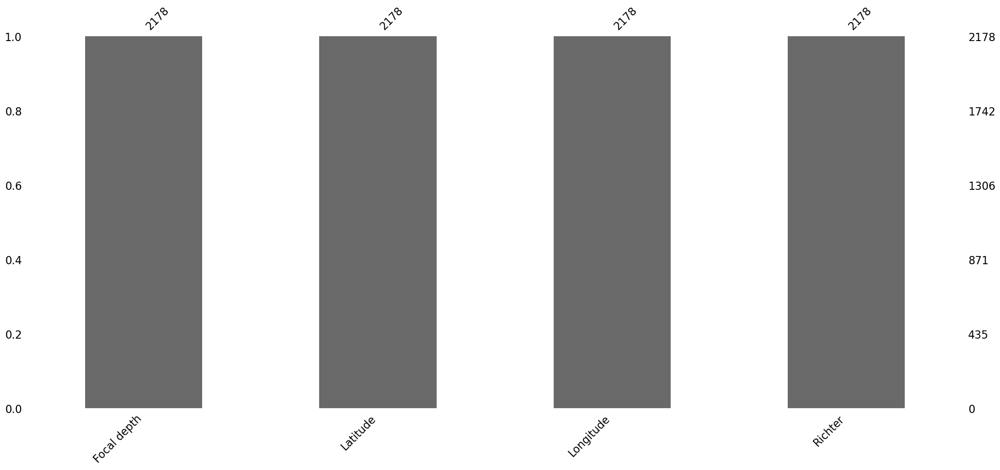

In [7]:
missingno.bar(df)

There are no missing values in the dataset.

In [8]:
df.describe()

,Focal depth,Latitude,Longitude,Richter
count,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181
std,116.467797,30.545583,118.875581,0.189426
min,0.000000,-66.490000,-179.960000,5.800000
25%,21.000000,-12.432500,-67.782500,5.800000
50%,39.000000,0.210000,122.100000,5.900000
75%,68.000000,36.480000,146.860000,6.100000
max,656.000000,78.150000,180.000000,6.900000


In [9]:
for feature in df.columns:
    print(f"---------------{feature.upper()}---------------")
    print(df[feature].value_counts(), end="\n\n")

---------------FOCAL DEPTH---------------
Focal depth
0      145
33     121
10      61
45      40
43      36
      ... 
328      1
574      1
333      1
170      1
527      1
Name: count, Length: 312, dtype: int64

---------------LATITUDE---------------
Latitude
 49.88    7
 49.91    7
 49.87    6
 49.92    5
-6.55     5
         ..
 42.09    1
-53.52    1
-16.05    1
-49.35    1
-10.16    1
Name: count, Length: 1824, dtype: int64

---------------LONGITUDE---------------
Longitude
 126.65    5
 78.92     5
 78.86     4
 78.97     4
 151.86    4
          ..
-157.14    1
 166.68    1
 153.60    1
-179.21    1
 122.23    1
Name: count, Length: 1958, dtype: int64

---------------RICHTER---------------
Richter
5.8    691
5.9    518
6.0    370
6.1    228
6.2    158
6.3     95
6.4     53
6.5     44
6.6     11
6.7      6
6.9      2
6.8      2
Name: count, dtype: int64



In [10]:
df.nunique()

Focal depth     312
Latitude       1824
Longitude      1958
Richter          12
dtype: int64

There is a relatively small amount of values for the Richter attribute.

## Data Visualization

In [11]:
def histogram(df, feature):
    sns.displot(data=df, x=feature, bins=30)
    plt.tight_layout()
    plt.show()

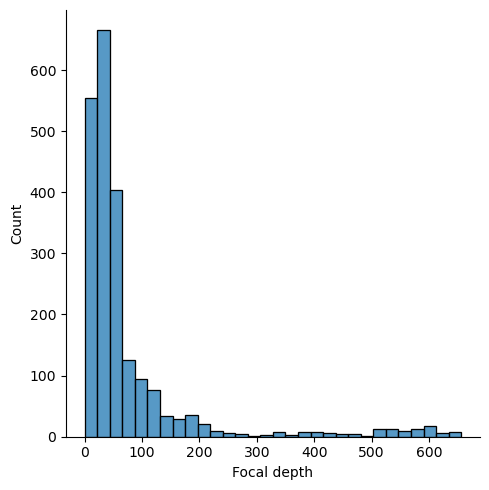

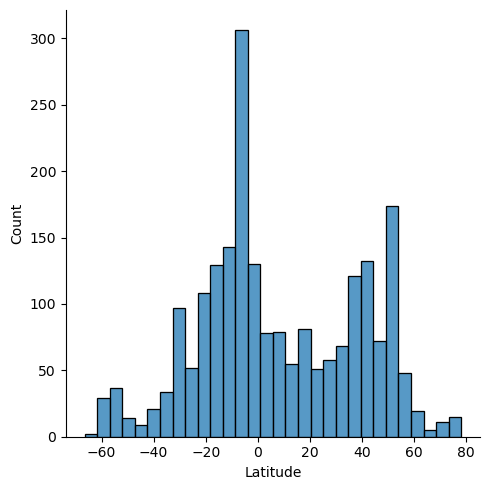

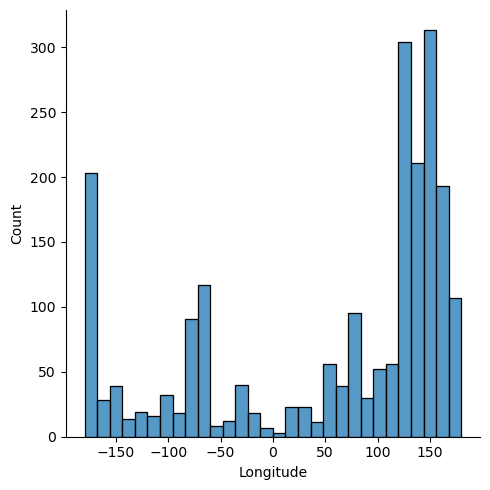

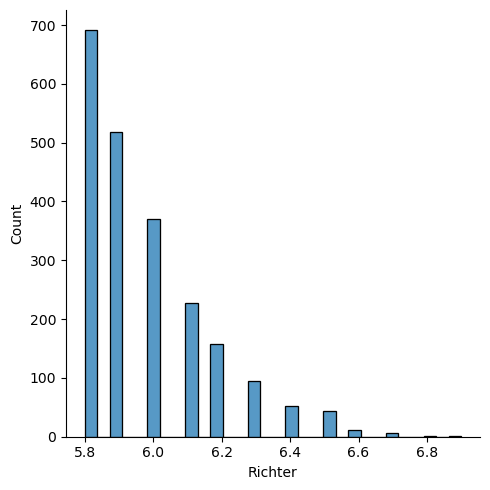

In [12]:
for feature in df.columns:  
    histogram(df, feature)

We can observe various distributions of attribute data. None of them closely resembles a Gaussian distribution. Therefore, in the data preparation phase, the data will be appropriately transformed and scaled.

In [13]:
geometry = [Point (xy) for xy in zip(df["Longitude"], df["Latitude"])]
gdf = GeoDataFrame(df, geometry=geometry)

<Axes: >

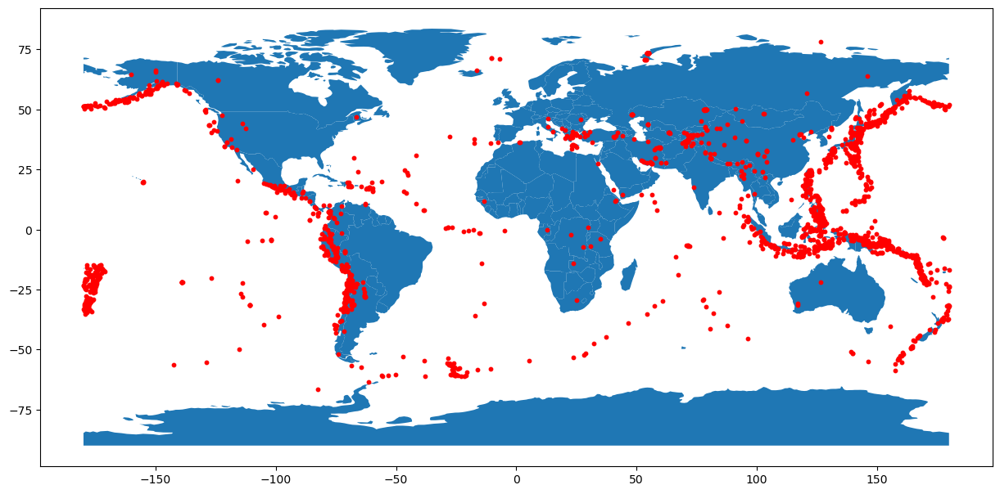

In [14]:
world_map = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))
gdf.plot(ax=world_map.plot(figsize=(15, 15)), marker="o", color="red", markersize=10)

Using domain knowledge, it can be noticed that earthquake measurement points predominate in the vicinity of tectonic plate boundaries.

In [15]:
def interactive_map(df, hue):
    fig = px.scatter_mapbox(df, 
                            lat="Latitude", 
                            lon="Longitude", 
                            hover_data=["Focal depth", "Richter"], 
                            zoom=1, 
                            height=600, 
                            width=950,
                            color=hue,  # Color points scale based on choosen feature
                            color_continuous_scale=px.colors.sequential.Jet)

    fig.update_layout(mapbox_style="carto-positron",
                      margin={"r": 0, "t": 0, "l": 0, "b": 0},
                      width=950)
    fig.show()

Just for visualization purposes, focal depths can be divided into:

- shallow earthquakes are between 0 and 70 km deep
- intermediate earthquakes, 70 - 300 km deep
- and deep earthquakes, 300 - 700 km deep

In [16]:
def map_depths():
    depth_ranges = [(0, 70), (70, 300), (300, 700)]
    colors = ["blue", "yellow", "red"]
    
    fig, ax = plt.subplots(figsize=(12,6))
    world_map.plot(color="lightgrey", ax=ax)

    for i in range(3):
        low, high = depth_ranges[i]
        filt = ((df["Focal depth"] >= low) & (df["Focal depth"] < high))
        df[filt].plot(x="Longitude", y="Latitude", kind="scatter", 
                      title=f"Focal depths [km]", 
                      ax=ax, s=5, c=colors[i], label=f"{low}-{high} [km]")

    ax.legend()
    plt.show()

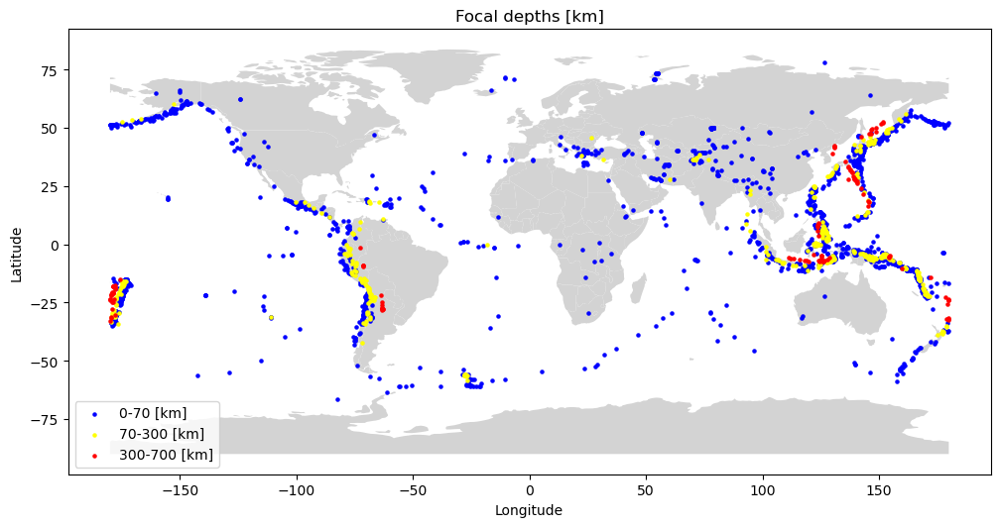

In [17]:
map_depths()

In [18]:
interactive_map(df, hue="Focal depth")

The deepest earthquakes were observed near Japan, the border between the South China Sea and the North Pacific, the Mariana Trench, and Indonesia.

In [19]:
def map_richter():
    richter_ranges = [(5.8, 6.0), (6.1, 6.3), (6.4, 6.6), (6.7, 6.9)]
    colors = ["blue", "yellow", "red", "black"]
    
    fig, ax = plt.subplots(figsize=(12,6))
    world_map.plot(color="lightgrey", ax=ax)

    for i in range(4):
        low, high = richter_ranges[i]
        filt = ((df["Richter"] >= low) & (df["Richter"] <= high))
        df[filt].plot(x="Longitude", y="Latitude", kind="scatter", 
                      title=f"Richter scale values", 
                      ax=ax, s=5, c=colors[i], label=f"{low}-{high} Richter")

    ax.legend()
    plt.show()

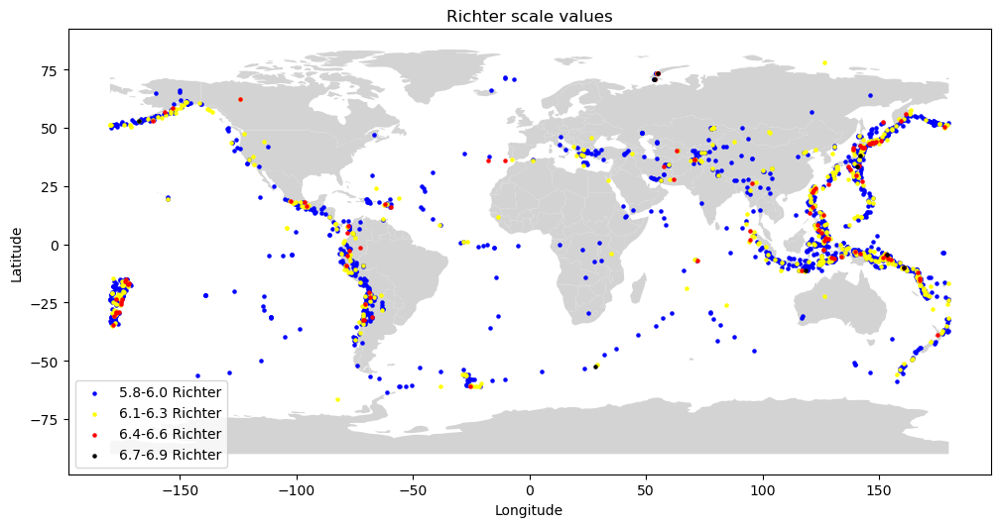

In [20]:
map_richter()

In [21]:
interactive_map(df, hue="Richter")

Definitely, the strongest earthquakes on the Richter scale occur again in the vicinity of the South China Sea, the North Pacific, the Mariana Trench, Indonesia, as well as in Central Asia and Chile.

It's worth mentioning that the Richter scale values present in the dataset indicate moderate strength, and there are no instances of very intensive earthquakes.

In [22]:
richter_ranges = [(0, 5.8, 6.0), (1, 6.1, 6.3), (2, 6.4, 6.6), (3, 6.7, 6.9)]

def get_richter_range(richter):
    for i, low, high in richter_ranges:
        if low <= richter <= high:
            return i

df_temp = df.copy()
df_temp["Richter range"] = df_temp["Richter"].apply(get_richter_range)

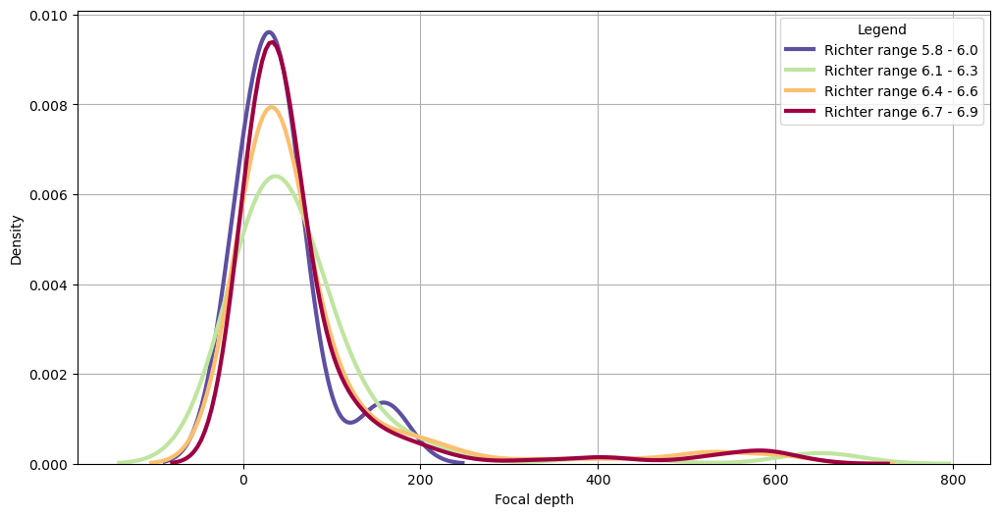

In [23]:
legend_labels = [f"Richter range {low} - {high}" for _, low, high in richter_ranges]

plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_temp, x="Focal depth", hue="Richter range", 
            common_norm=False, palette="Spectral", linewidth=3)
plt.legend(title="Legend", labels=legend_labels, loc="upper right")
plt.grid()
plt.show()

From the density plot, it can be observed that there is a slight dependency, indicating that as the focal depth increases, the Richter magnitude is higher. However, this is a small number of cases compared to the majority of data, where the focal depth is less than 50 km.

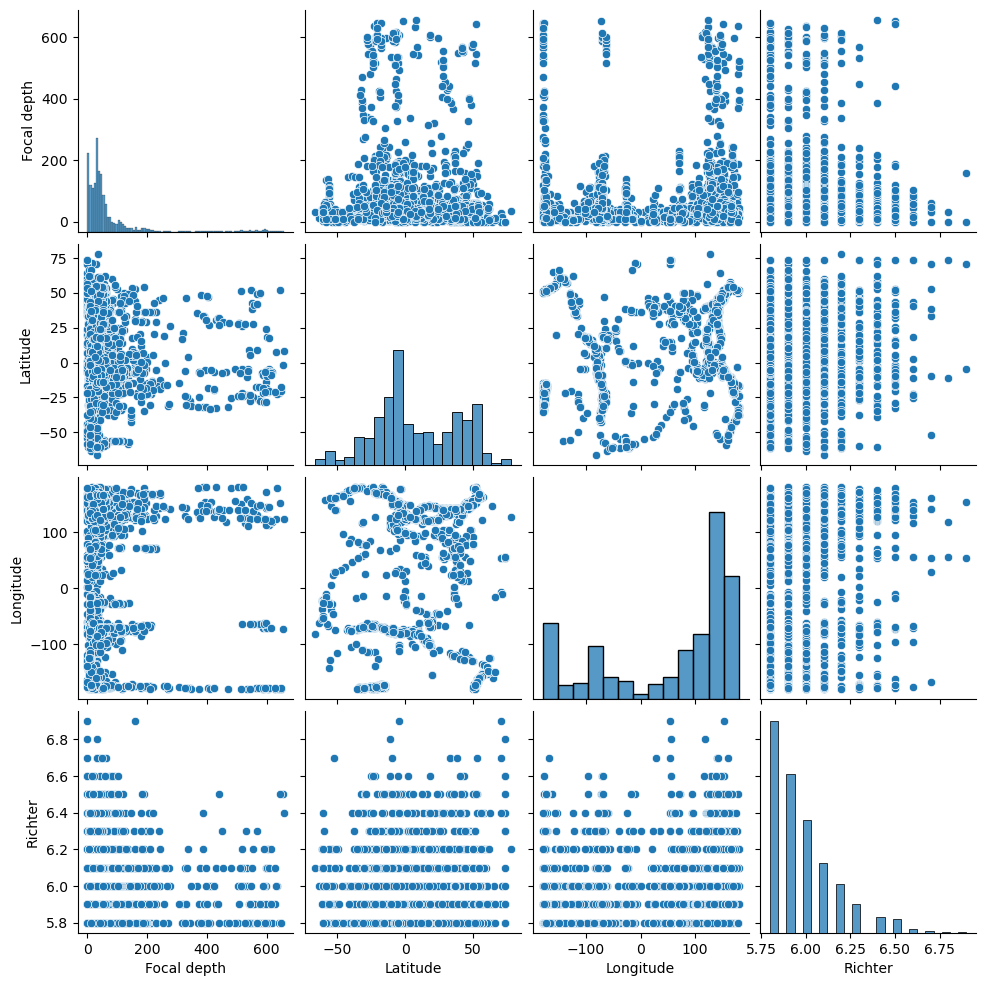

In [24]:
sns.pairplot(df)
plt.show()

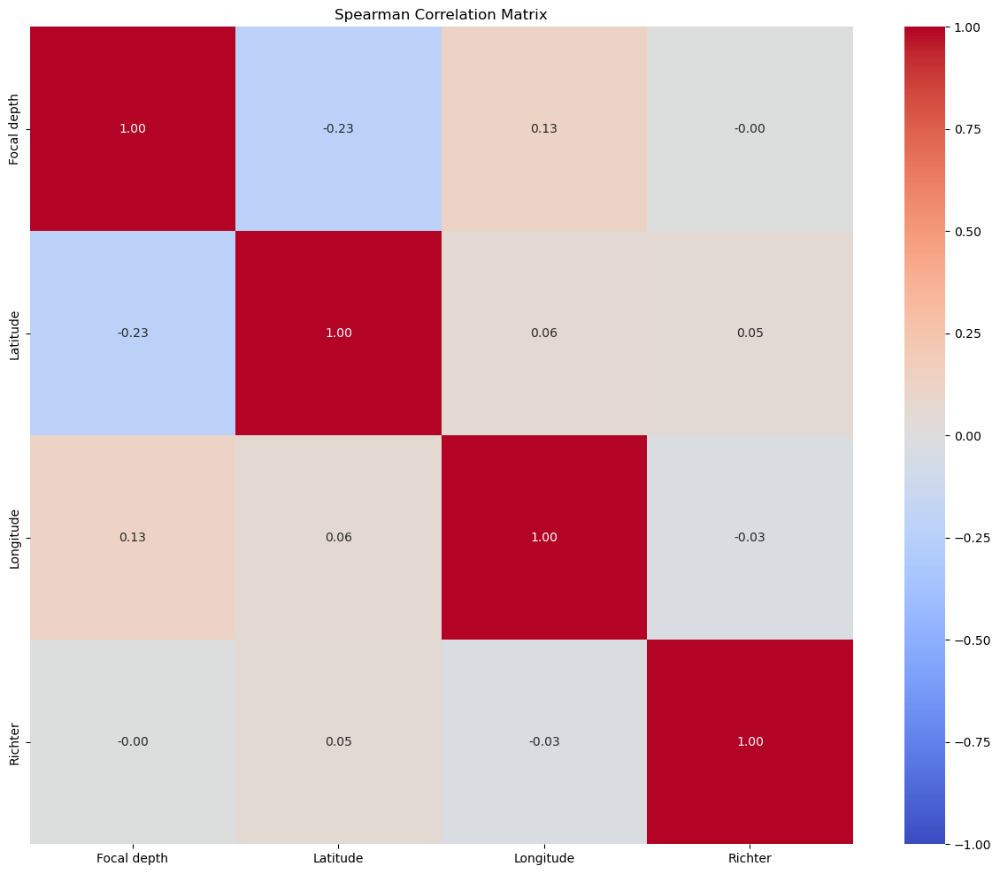

In [25]:
fig, ax = plt.subplots(figsize=(15, 12))
sns.heatmap(df.corr(method="spearman"), cmap="coolwarm", annot=True, fmt=".2f", vmin=-1, vmax=1)
plt.title("Spearman Correlation Matrix")
plt.show()

There is no strong negative or positive correlation between the attributes.

---

# Data Preparation

## Cartesian coordinates convertion

It is beneficial to convert geographical coordinates expressed in latitude and longitude to three-dimensional Cartesian coordinates (X, Y, Z) on the surface of a unit sphere. This transformation scales the coordinates and makes them suitable for certain clustering algorithms that rely on Euclidean distance.

In [26]:
df_prep = pd.DataFrame(data=df, columns=df.columns)

In [27]:
df_prep["X coord"] = np.cos(df["Latitude"]) * np.cos(df["Longitude"])
df_prep["Y coord"] = np.cos(df["Latitude"]) * np.sin(df["Longitude"])
df_prep["Z coord"] = np.sin(df["Latitude"])

In [28]:
df_prep.drop(columns=["Latitude", "Longitude"], inplace=True)

In [29]:
df_prep_cols = df_prep.columns

In [30]:
df_prep

,Focal depth,Richter,X coord,Y coord,Z coord
0,33,6.7,0.411020,0.010552,-0.911565
1,36,5.8,0.022886,0.003075,0.999733
2,57,5.8,0.086126,0.525445,-0.846457
3,67,6.2,0.594355,-0.133952,-0.792969
4,30,6.0,-0.932981,-0.154392,-0.325129
...,...,...,...,...,...
2173,13,5.8,-0.276920,0.092508,0.956430
2174,97,5.9,0.522674,0.526216,0.670752
2175,527,5.8,-0.263663,-0.880746,0.393406
2176,51,6.0,-0.274628,0.113424,-0.954837


## Scaling

Due to the significant data distribution skewness of the Focal depth attribute, a logarithmic transformation will be applied.

In [31]:
df_prep["Focal depth"] = np.log1p(df_prep["Focal depth"])

To scale the Focal depth and Richter attributes, the Robust Scaler was utilized. This scaler is particularly useful when dealing with datasets that contain outliers or exhibit significant skewness. Unlike standard scaling methods, the Robust Scaler employs robust statistics, such as the median and interquartile range, making it less sensitive to extreme values. This ensures a more reliable scaling process, especially in the presence of non-normally distributed data.

In [32]:
scaler = RobustScaler()
df_prep[["Focal depth", "Richter"]] = scaler.fit_transform(df_prep[["Focal depth", "Richter"]])

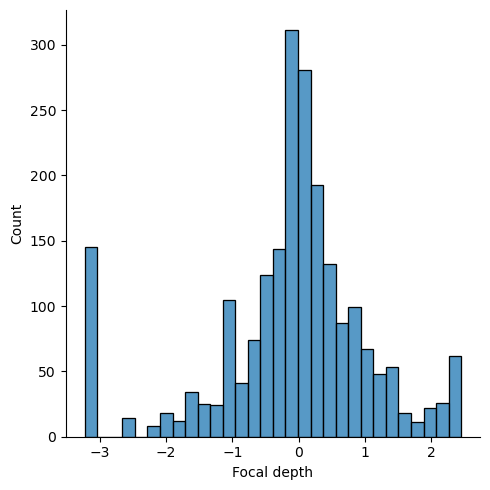

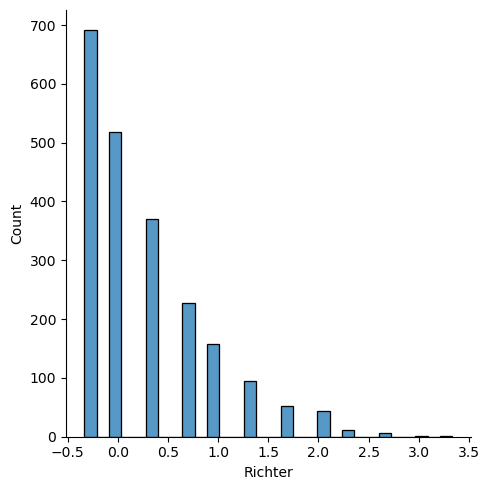

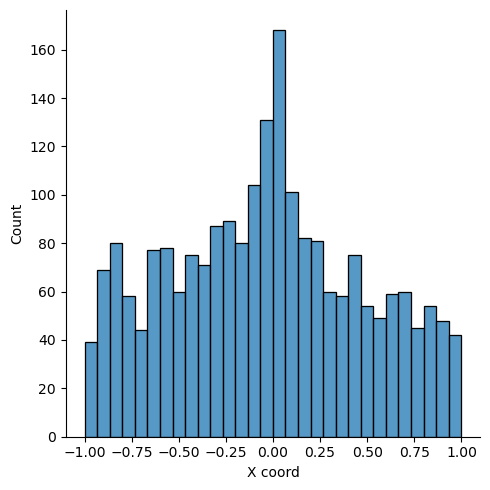

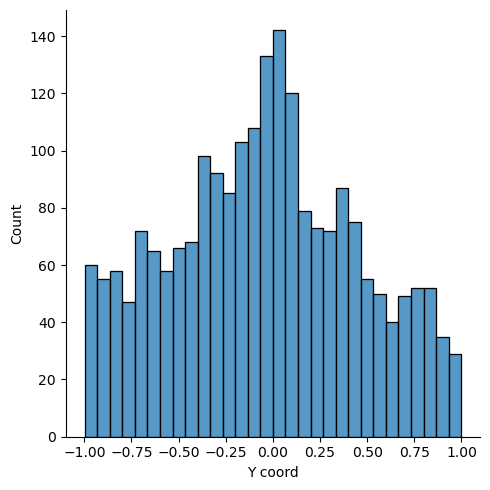

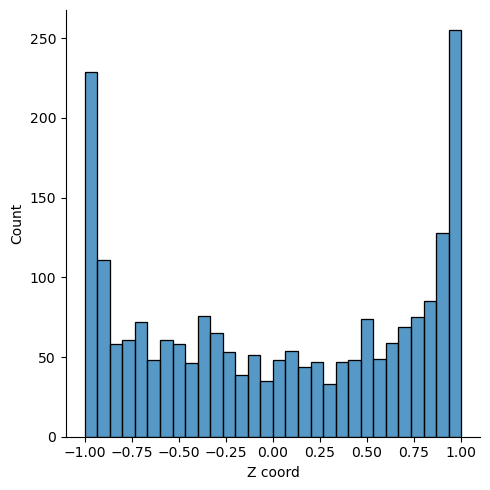

In [33]:
for feature in df_prep.columns:  
    histogram(df_prep, feature)

**Important Note**

The data has been prepared in such a way that in clustering algorithms, data with similar earthquake parameters (Focal depth and Richter value) are classified into one cluster. To achieve this, RobustScaler and Cartesian coordinate transformation were used. The prepared data, after dimensionality reduction using PCA to 3 dimensions, forms a shape similar to a cuboid with clusters.

Applying different methods of transformation and scaling, such as Standard Scaler and MinMaxScaler, places greater emphasis on the geographical locations of points, and they are clustered based on their positions (enabling the identification of earthquakes on specific continents or locations in the case of a large number of clusters). In this scenario, the arrangement of points in 3D after PCA reduction resembles a cylinder.

This conclusions were drawn based on a separate analysis that was not included in these considerations.

---

# K-Means Clustering

## k-means model with 15 clusters

In [34]:
k_means = KMeans(n_clusters=15, random_state=0)

In [35]:
k_means_labels = k_means.fit_predict(df_prep)

### 2D Visualization with PCA

In [36]:
pca = PCA(n_components=2)

In [37]:
df_pca = pd.DataFrame(data=pca.fit_transform(df_prep), columns=["pca1", "pca2"])

In [38]:
df_pca["cluster"] = k_means_labels

In [39]:
k_means_labels

array([13,  1, 11, ..., 10, 11, 11], dtype=int32)

In [40]:
df_pca

,pca1,pca2,cluster
0,0.064218,-0.838771,13
1,-0.098208,0.942630,1
2,-0.427849,-0.926426,11
3,-0.578262,-0.804764,13
4,0.157476,-0.347683,9
...,...,...,...
2173,0.767116,0.924863,12
2174,-0.954763,0.588010,5
2175,-2.388749,0.278726,10
2176,-0.303700,-0.995493,11


In [41]:
fig = px.scatter(df_pca, x="pca1", y="pca2", color="cluster",
                 title="2D PCA Components Scatter Plot with 15 Clusters",
                 labels={"pca1": "Principal Component 1", "pca2": "Principal Component 2"},
                 hover_data={"pca1": True, "pca2": True, "cluster": True})

fig.show()

### 3D Visualization with PCA

In [42]:
pca = PCA(n_components=3)

In [43]:
df_pca = pd.DataFrame(data=pca.fit_transform(df_prep), columns=["pca1", "pca2", "pca3"])

In [44]:
df_pca["cluster"] = k_means_labels

In [45]:
fig = px.scatter_3d(df_pca, x="pca1", y="pca2", z="pca3", color="cluster",
                    title="3D PCA Components Scatter Plot with 15 Clusters",
                    labels={"pca1": "Principal Component 1", "pca2": "Principal Component 2", "pca3": "Principal Component 3"},
                    hover_data={"pca1": True, "pca2": True, "pca3": True, "cluster": True})

fig.show()

We can observe a clear structure of clusters that are appropriately divided. In the 3D space using PCA, outliers are visible and classified into one of the clusters. While K-means cannot handle outliers well, in this case, there are few earthquake instances that could potentially be classified as outliers. Therefore, the impact of outliers on the effectiveness of the clustering algorithm is minimal.

### World map visualization

In [46]:
interactive_map(df, hue=k_means_labels)

Due to the relatively large number of clusters, it is challenging to visually distinguish characteristic points on the map at first glance. However, upon closer analysis, it can be observed that the algorithm identifies various points with similar Focal depth and Richter values, also taking into account their geographical locations to some extent. As a result, several points with similar earthquake parameters within a radius of, for example, 100 km are classified into the same cluster.

It's important to note that the data has been prepared in such a way that greater emphasis is placed on similar values of Focal depth and Richter value, rather than, for instance, categorizing earthquakes in a particular continent into a single cluster.

In [47]:
df_pca["cluster"].value_counts()

cluster
1     278
11    254
9     189
4     177
5     160
8     156
12    145
7     134
6     131
13    124
14    117
2     106
10    104
3      70
0      33
Name: count, dtype: int64

In [48]:
def filter_data(df, labels, filt):
    df_temp = pd.DataFrame(data=df, columns=df.columns)
    df_temp["Cluster"] = labels
    df_temp = df_temp[filt]
    
    return df_temp

Filtering data with Richter values greater than 6.5 reveals that they exhibit only three distinct cluster classes, further dependent on both location and focal depth.

In [49]:
df_temp = filter_data(df, k_means_labels, (df["Richter"] > 6.5))

In [50]:
interactive_map(df_temp, hue=df_temp["Cluster"])

Filtering data with focal depth greater than 500 km reveals only two distinct cluster classes. Hence, there is a suspicion that the algorithm places a slightly greater emphasis on focal depth than on the Richter scale. This assumption is valid since, in the case of these data, the Richter scale is limited to moderate earthquakes, and it doesn't make sense to increase sensitivity to the Richter scale attribute.

In [51]:
df_temp = filter_data(df, k_means_labels, (df["Focal depth"] > 500))

In [52]:
interactive_map(df_temp, hue=df_temp["Cluster"])

In [53]:
df_temp = filter_data(df, k_means_labels, (df["Focal depth"] == 45))

In [54]:
interactive_map(df_temp, hue=df_temp["Cluster"])

For instance, for data points with a focal depth of 45 km and a Richter value of 6.4, it is possible to clearly distinguish points belonging to the same cluster. This indicates that the algorithm performs good on such data.

In [55]:
df_temp = filter_data(df, k_means_labels, ((df["Focal depth"] == 45) & (df["Richter"] == 6.4)))

In [56]:
interactive_map(df_temp, hue=df_temp["Cluster"])

## Optimal number of clusters for k-means

### Elbow rule

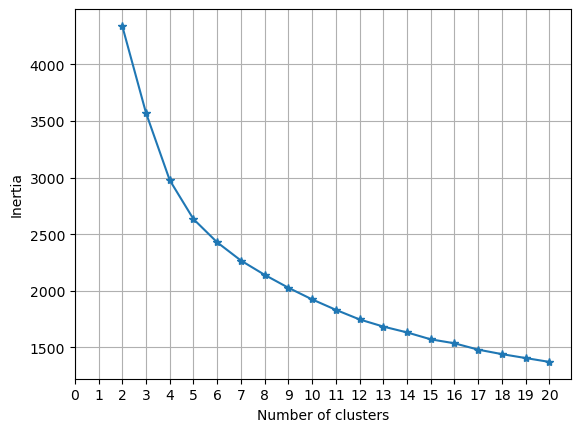

In [57]:
inertias = []
n_clusters = np.arange(2, 21)

for n in n_clusters:
    kmeans = KMeans(n_clusters=n, random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(df_prep)

    inertias.append(kmeans.inertia_)

plt.plot(n_clusters, inertias, marker="*")
plt.xticks(np.arange(0, 21))
plt.ylabel("Inertia")
plt.xlabel("Number of clusters")
plt.grid()
plt.show()

It can be observed that the 'elbow' occurs around the number of clusters equal to 5, 6, and 7. Heuristically, it can be assumed that the optimal number of clusters for this method is 7 (this value was chosen because the Silhouette method suggests an optimal number of clusters as 5).

In [58]:
k_means = KMeans(n_clusters=7, random_state=0)
k_means_labels = k_means.fit_predict(df_prep)

#### Visualizations

In [59]:
pca = PCA(n_components=3)
df_pca = pd.DataFrame(data=pca.fit_transform(df_prep), columns=["pca1", "pca2", "pca3"])
df_pca["cluster"] = k_means_labels

fig = px.scatter_3d(df_pca, x="pca1", y="pca2", z="pca3", color="cluster",
                    title="3D PCA Components Scatter Plot with 7 Clusters",
                    labels={"pca1": "Principal Component 1", "pca2": "Principal Component 2", "pca3": "Principal Component 3"},
                    hover_data={"pca1": True, "pca2": True, "pca3": True, "cluster": True})

fig.show()

In [60]:
interactive_map(df, hue=k_means_labels)

We can observe that the algorithm performs well in distinguishing points based on the combination of Richter and Focal depth very accurately. This is particularly evident in the following regions:

- South Georgia and South Sandwich Islands (Scotia Sea), where we observe cluster 3 for earthquakes with focal depth near 100 km and Richter scale 6.0-6.2, cluster 4 for those with 50 km and Richter 5.8, and a group of points in clusters 0 and 1.
- North Argentina, Bolivia, and Peru exhibit a group of focal depth around 500 km belonging to cluster 2.
- Particularly visible around East Java Island, Bali, and West Nusa Tenggara, where three distinct 'belts' of points are classified into 3 clusters: the northern cluster for earthquakes with focal depth 500-600 km and Richter scale around 5.8; inland quakes with focal depth 50-90 km and Richter scale around 5.9 (cluster number 4); cluster number 1 for data with focal depth around 30 km and Richter 5.9.
- A group of points near the Mariana Trench (cluster number 2 - as explained previously in North Argentina) and on the North New Zeland ocean regions.

Overall, these observations suggest that the algorithm successfully captures the underlying patterns in the data.

### Silhouette method

In [61]:
def plot_silhoette(model, X, X_2d, max_num_clusters=5, minibatch=0):
    for n_clusters in range(2, max_num_clusters):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        
        if minibatch == 0:
            clusterer = model(n_clusters=n_clusters, random_state=0, n_init=10)
        else:
            clusterer = model(n_clusters=n_clusters, random_state=0, init="k-means++", n_init=10, batch_size=minibatch)

        cluster_labels = clusterer.fit_predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters, \
              "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X_2d[:, 0], X_2d[:, 1], marker='.', s=300, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                    "with n_clusters = %d" % n_clusters),
                    fontsize=14, fontweight="bold")

    plt.show()

From this analysis, it is evident that the highest silhouette scores are achieved for the number of clusters equal to 2, 4, and 5. Due to the large amount of data, it is better to choose a higher number of clusters; hence, the optimal number of clusters selected for the Silhouette method is 5. This aligns with the observation that the optimal number of clusters is around 5, as seen in the elbow rule.

For n_clusters = 2 The average silhouette_score is : 0.34668586854830336
For n_clusters = 3 The average silhouette_score is : 0.2343019798861015
For n_clusters = 4 The average silhouette_score is : 0.2432544813358309
For n_clusters = 5 The average silhouette_score is : 0.24517941248103087
For n_clusters = 6 The average silhouette_score is : 0.22913387307968724
For n_clusters = 7 The average silhouette_score is : 0.20460536245889122
For n_clusters = 8 The average silhouette_score is : 0.21237796982939774
For n_clusters = 9 The average silhouette_score is : 0.2158787825507998


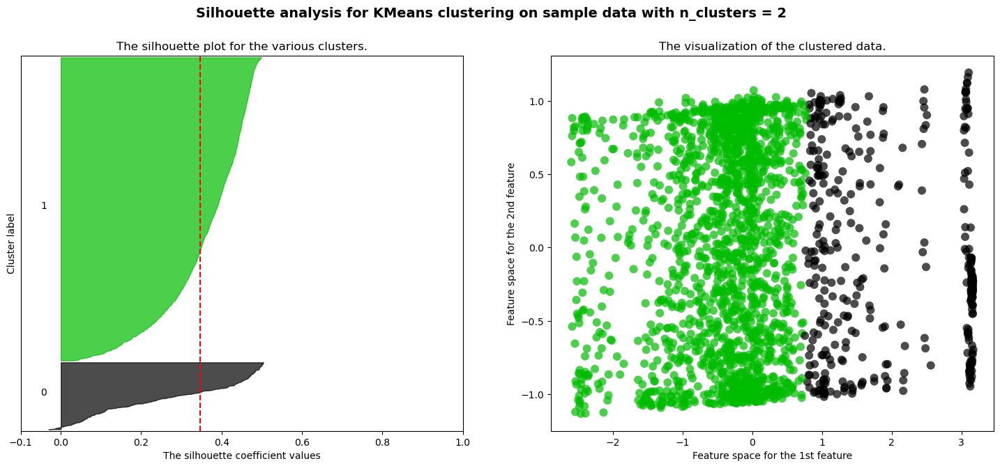

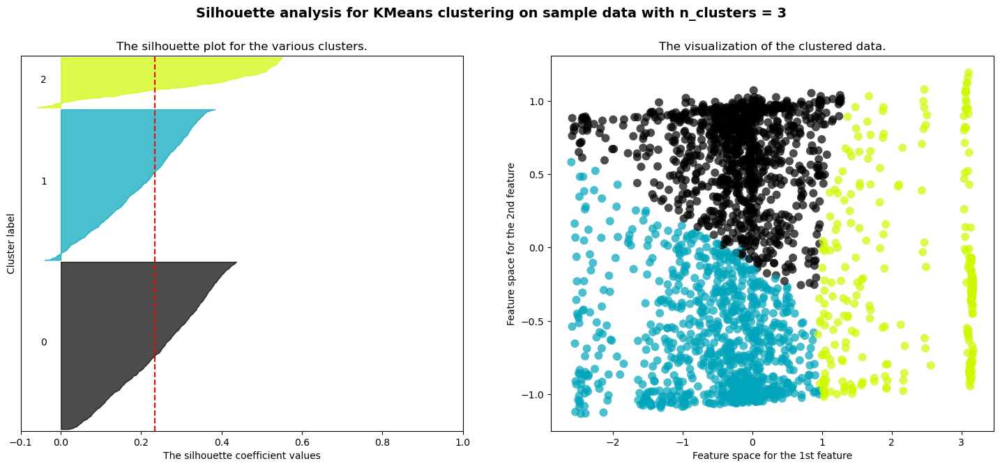

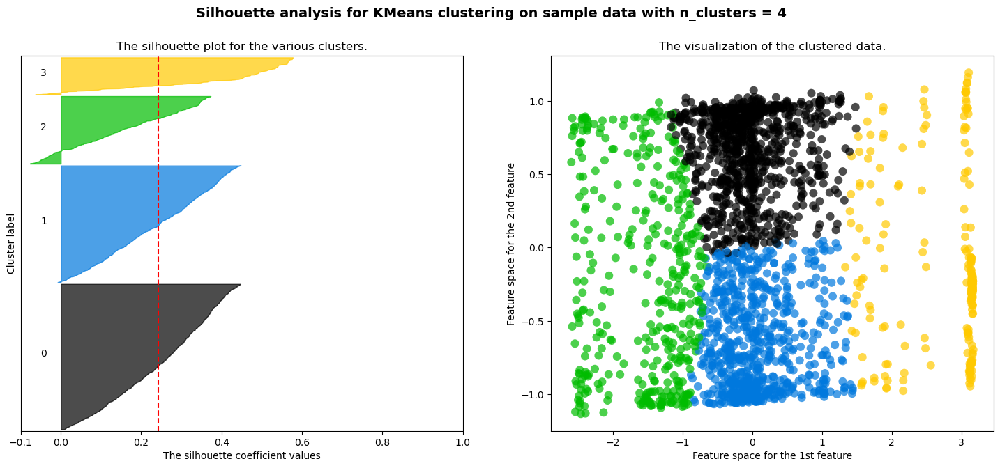

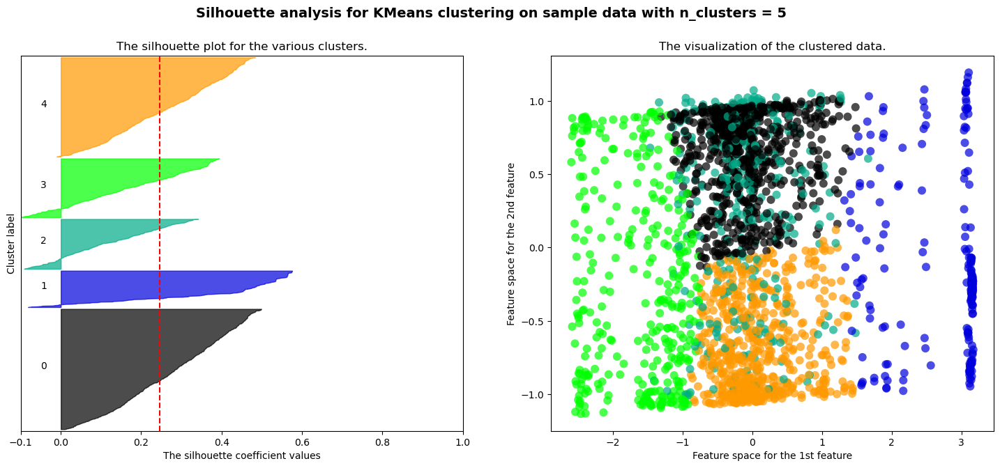

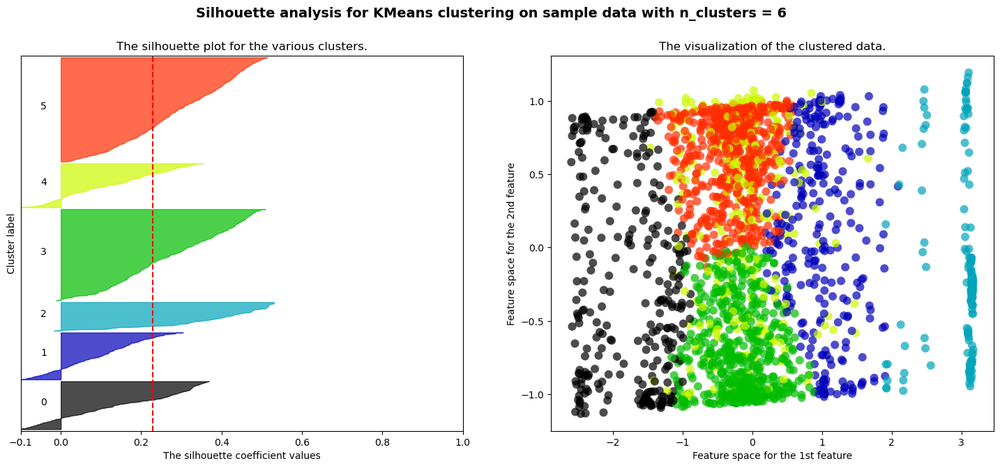

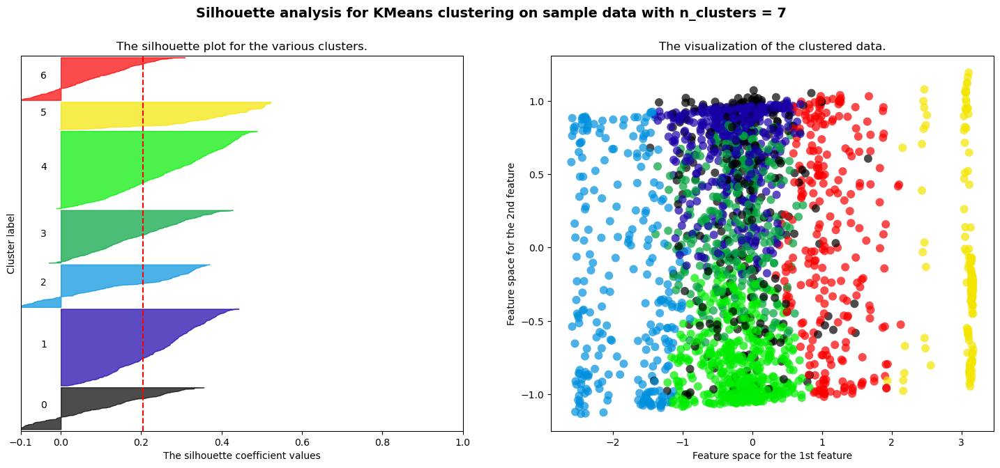

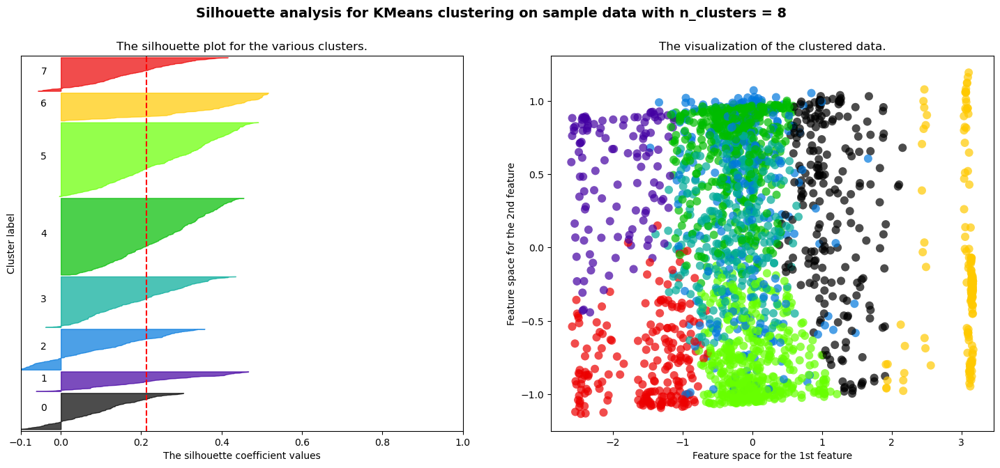

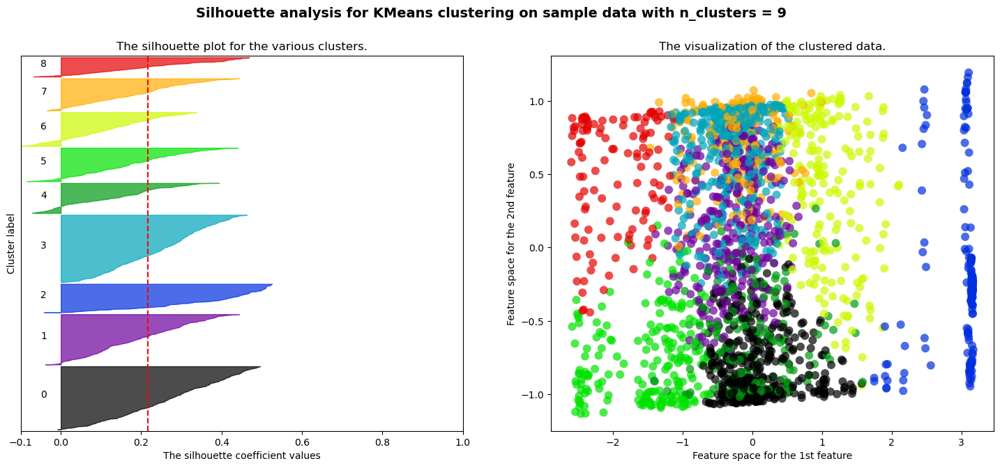

In [62]:
pca = PCA(n_components=2)
plot_silhoette(KMeans, df_prep, pca.fit_transform(df_prep), 10)

In [63]:
k_means = KMeans(n_clusters=5, random_state=0)
k_means_labels = k_means.fit_predict(df_prep)

#### Visualizations

In [64]:
pca = PCA(n_components=3)
df_pca = pd.DataFrame(data=pca.fit_transform(df_prep), columns=["pca1", "pca2", "pca3"])
df_pca["cluster"] = k_means_labels

fig = px.scatter_3d(df_pca, x="pca1", y="pca2", z="pca3", color="cluster",
                    title="3D PCA Components Scatter Plot with 5 Clusters",
                    labels={"pca1": "Principal Component 1", "pca2": "Principal Component 2", "pca3": "Principal Component 3"},
                    hover_data={"pca1": True, "pca2": True, "pca3": True, "cluster": True})

fig.show()

In [65]:
interactive_map(df, hue=k_means_labels)

The clustering is similar to when the number of clusters is set to 7. However, this clustering is not as detailed as the optimal 7-cluster configuration. Nevertheless, it can be used for clustering points at a greater geographical distance. We can identify earthquake points with similar characteristics at a scale comparable to that of an average-sized country.

## Mini-batch k-means

For n_clusters = 2 The average silhouette_score is : 0.21868278462765328
For n_clusters = 3 The average silhouette_score is : 0.23620543257290325
For n_clusters = 4 The average silhouette_score is : 0.2440934762522105
For n_clusters = 5 The average silhouette_score is : 0.24370306018939786
For n_clusters = 6 The average silhouette_score is : 0.21255332692148968
For n_clusters = 7 The average silhouette_score is : 0.17778950063896862
For n_clusters = 8 The average silhouette_score is : 0.1916601449156254
For n_clusters = 9 The average silhouette_score is : 0.20305378256625306


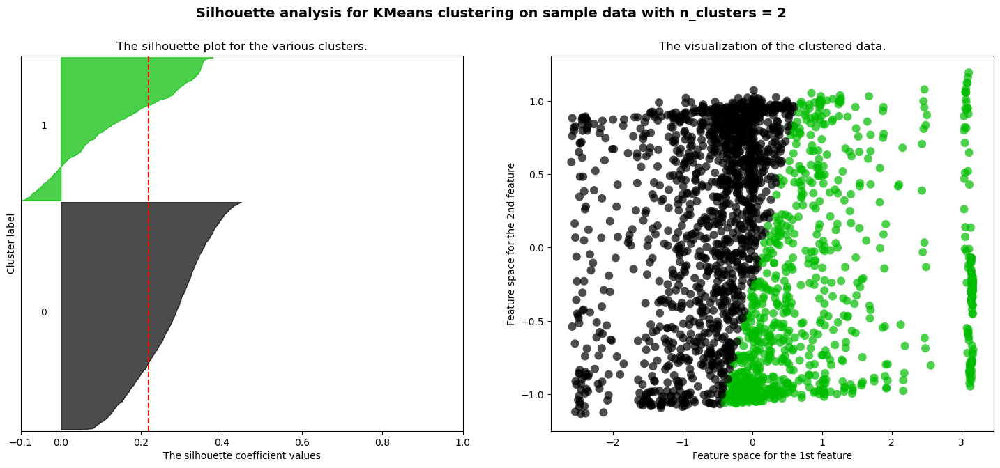

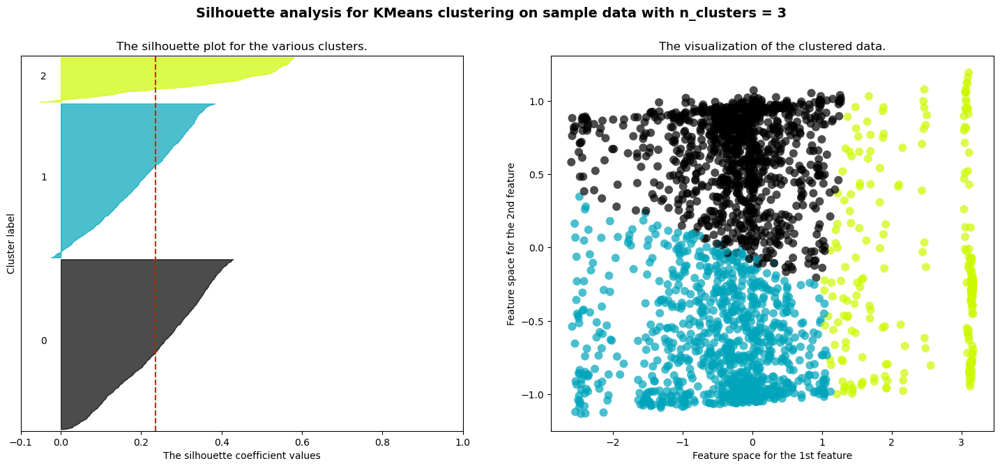

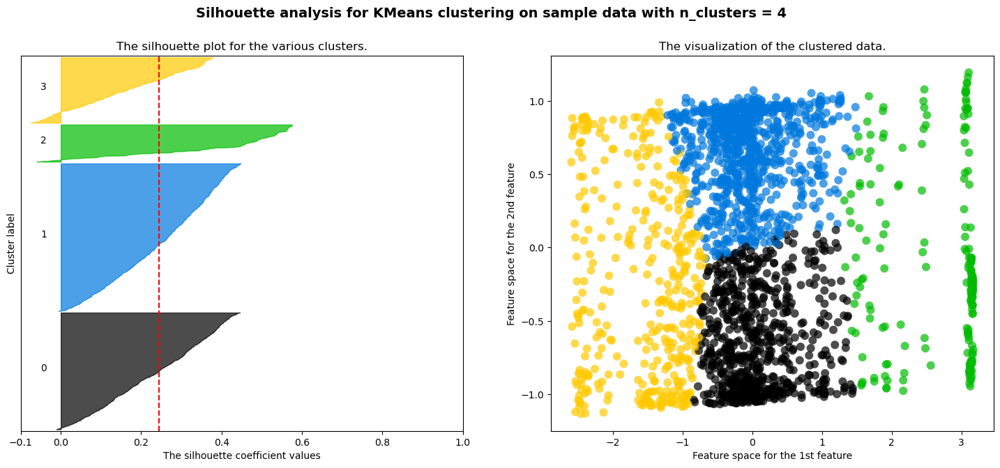

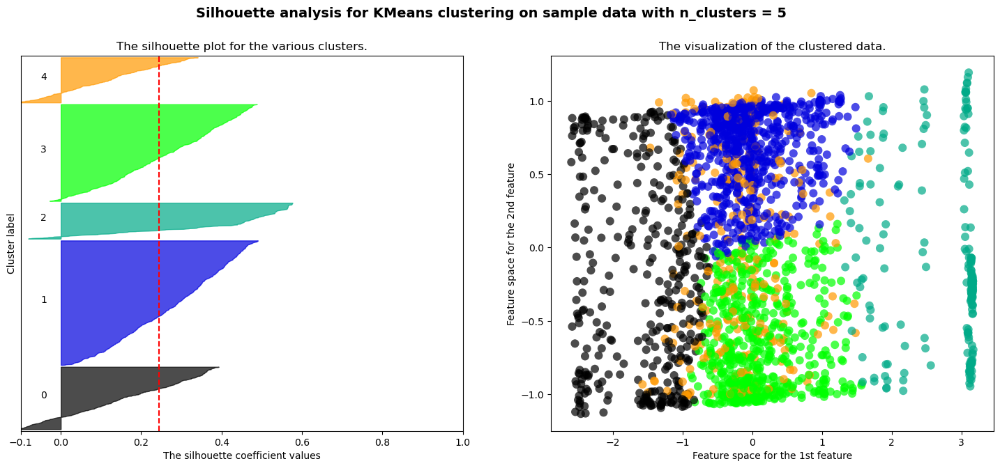

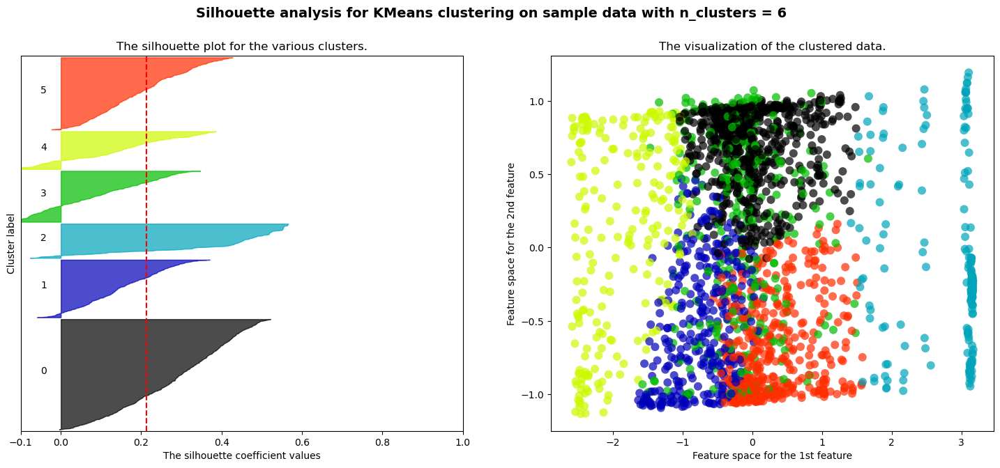

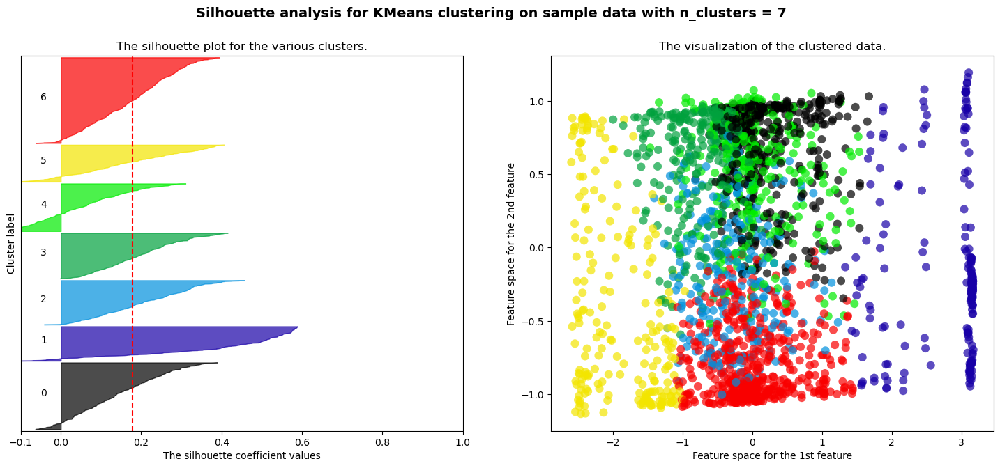

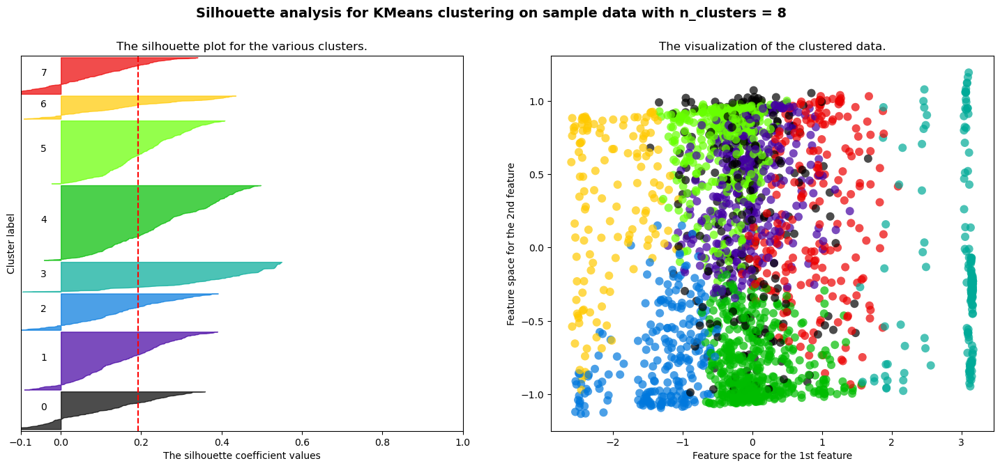

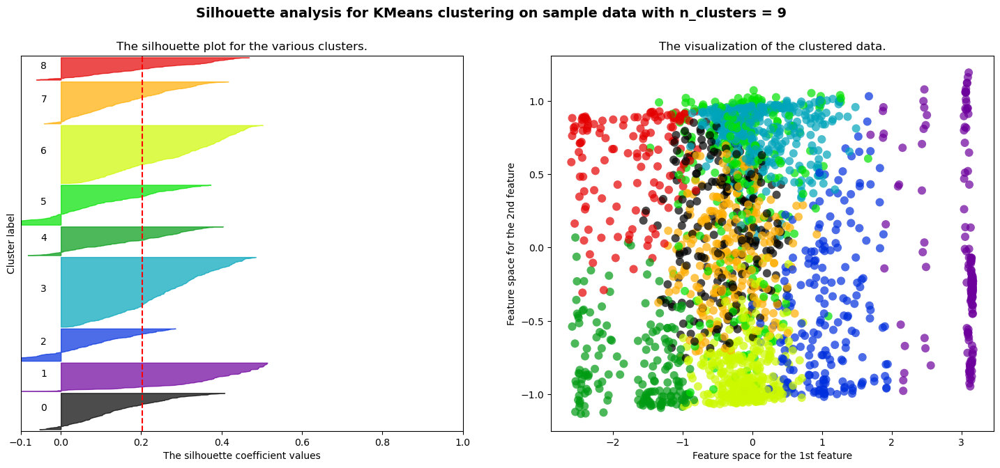

In [66]:
pca = PCA(n_components=2)
plot_silhoette(MiniBatchKMeans, df_prep, pca.fit_transform(df_prep), 10, minibatch=500)

In [67]:
minibatch_k_means = MiniBatchKMeans(n_clusters=4, random_state=0, init="k-means++", n_init=10, batch_size=500)
minibatch_k_means_labels = minibatch_k_means.fit_predict(df_prep)

Splitting the data into batches of size 500 yields the best Silhouette Method result for 4 clusters. Silhouette score .24 for 4 clusers is considered a moderate silhouette score, indicating a fair degree of separation between the clusters.

In [68]:
interactive_map(df, hue=minibatch_k_means_labels)

In this case, the Mini-Batch algorithm shows higher sensitivity to Focal depth compared to the K-means algorithm. This is evident in the map below.

In [69]:
df_temp = filter_data(df, minibatch_k_means_labels, (df["Focal depth"] > 500))

In [70]:
interactive_map(df_temp, hue=df_temp["Cluster"])

In [71]:
df_temp = filter_data(df, minibatch_k_means_labels, (df["Focal depth"] == 45))

In [72]:
interactive_map(df_temp, hue=df_temp["Cluster"])

### Conclusions - K-means vs. Mini-batch Algorithm

Similar distribution of silhouette score values was obtained for different numbers of clusters as in the case of the K-means model. Both models (K-means and Mini-Batch) achieve the highest scores for 4 and 5 clusters. From the observations on the map, it can be inferred that the K-means algorithm slightly outperforms the Mini-Batch algorithm, as it shows more detailed clustering of points and places slightly less emphasis on Focal depth. In some situations, the Mini-Batch algorithm tends to generalize the data too much, forming a single cluster.

---

- labels from k-means clustering as a ground truth for external metrics

In [73]:
k_means = KMeans(n_clusters=7, random_state=0)
k_means_labels = k_means.fit_predict(df_prep)

---

# Gaussian Mixture

## hyperparameters tuning

In [74]:
number_of_components = [3, 4, 5, 6, 7, 8, 9, 10]
covariance_types = ["full", "tied", "diag", "spherical"]

for i in number_of_components:
    for cov in covariance_types:
        model = GaussianMixture(n_components=i, covariance_type=cov, random_state=0)
        labels = model.fit_predict(df_prep)
        
        # internal metrics
        cal_har_score = calinski_harabasz_score(df_prep, labels)
        silh_score = silhouette_score(df_prep, labels)
        
        # external metrics
        ami_score = adjusted_mutual_info_score(k_means_labels, labels)
        ar_score = adjusted_rand_score(k_means_labels, labels)
        
        print(f"Num of components {i}, Covariance type '{cov}':")
        print(f"\t- Calinski-Harabasz score: {cal_har_score}")
        print(f"\t- Silhouette score: {silh_score}")
        print(f"\t- Adjusted mutual info score: {ami_score}")
        print(f"\t- Adjusted random index score: {ar_score}", end="\n\n")     

Num of components 3, Covariance type 'full':
	- Calinski-Harabasz score: 497.7741240261296
	- Silhouette score: 0.12052512479281699
	- Adjusted mutual info score: 0.25222342035786577
	- Adjusted random index score: 0.09193446429584534

Num of components 3, Covariance type 'tied':
	- Calinski-Harabasz score: 599.1459928649325
	- Silhouette score: 0.21299663481947956
	- Adjusted mutual info score: 0.34409985501456003
	- Adjusted random index score: 0.237184352637222

Num of components 3, Covariance type 'diag':
	- Calinski-Harabasz score: 495.31821566714046
	- Silhouette score: 0.11755668830201745
	- Adjusted mutual info score: 0.2589438643682029
	- Adjusted random index score: 0.09379857630098136

Num of components 3, Covariance type 'spherical':
	- Calinski-Harabasz score: 613.0898248862275
	- Silhouette score: 0.11861681723843964
	- Adjusted mutual info score: 0.336167956718979
	- Adjusted random index score: 0.13470781356648864

Num of components 4, Covariance type 'full':
	- Calinsk

## best model for internal metrics

The exploration of Gaussian Mixture Models with varying numbers of components and covariance types resulted in notable differences in internal and external metric scores. The analysis indicates that, among the tested configurations, the model with n_components=4 and covariance_type='Spherical' achieved favorable metrics across multiple criteria. Specifically, it exhibited a high Silhouette score of 0.24, indicating well-defined clusters, and yielded competitive scores for external metrics such as Adjusted Mutual Information (0.51) and Adjusted Random Index (0.40).

Therefore, the chosen configuration (n_components=4, covariance_type='Spherical') seems to strike a good balance between cluster quality and overall model performance, making it a suitable choice for the given dataset and clustering task.

The values for the number of components were selected based on their impact on metrics. For instance, very low values resulted in poor performance, and increasing the number of components beyond 10 for selected covariance types did not yield satisfactory results in both metrics and the visualization of clusters on the world map.

The choice of the 'spherical' covariance type for the Gaussian Mixture Model (GMM) was based on a combination of metric scores and visual inspection of cluster quality. The spherical covariance type assumes that all dimensions are equally scaled, which might be appropriate when the clusters are spherical and have a similar size. The decision was influenced by the observation that, for the selected dataset, this covariance type yielded competitive performance across various metrics, including Silhouette score, Adjusted Mutual Information, and Adjusted Random Index.

The decision to focus on 'n_components' and 'covariance_type' for this model, as opposed to other parameters, was driven by the goal to simplify the model while capturing meaningful patterns in the data. Experimentation with other parameters did not lead to substantial improvements in performance or interpretability. Therefore, a pragmatic approach was taken to streamline the model, considering these two parameters as crucial contributors to the model's effectiveness in clustering the earthquake data.

In [75]:
gm_model = GaussianMixture(n_components=4, covariance_type="spherical", random_state=0)
gm_labels = gm_model.fit_predict(df_prep)

In [76]:
interactive_map(df, hue=gm_labels)

## best model for external metrics

The Gaussian Mixture Model (GMM) parameters were selected based on the adjusted mutual info and adjusted random index scores. Notably, higher scores were consistently associated with a greater number of components and the 'spherical' covariance type. The adjusted mutual info scores exhibited an upward trend with the increasing number of components, peaking at 8 components, and the 'spherical' covariance type consistently performed well.

Similarly, the adjusted random index scores showed a positive correlation with the number of components, and the 'spherical' covariance type demonstrated competitive performance across different configurations. The optimal balance between model complexity and performance led to the choice of 'n_components=8' and 'covariance_type="spherical"' for the Gaussian Mixture Model.

This decision was driven by the robust performance of the 'spherical' covariance type across various component numbers and its effectiveness in handling spherical clusters. The selection of 8 components was motivated by the observed improvement in both adjusted mutual info and adjusted random index scores, indicating enhanced clustering performance.

The impact of changing parameters on external metrics revealed that adjusting the 'n_components' parameter influenced model complexity. Higher values of 'n_components' allowed the model to capture finer details in the data, resulting in improved metric scores. Meanwhile, altering the 'covariance_type' parameter affected the model's ability to identify clusters of varying shapes, with the 'spherical' covariance type chosen for its versatility.

There exists a trade-off between model complexity and interpretability. While higher 'n_components' values might boost metric scores, they can also lead to overfitting and a less interpretable model. Therefore, the choice of 8 components strikes a balance, allowing the model to capture meaningful patterns without introducing excessive complexity.

In [77]:
gm_model = GaussianMixture(n_components=8, covariance_type="spherical", random_state=0)
gm_labels_ext = gm_model.fit_predict(df_prep)

In [78]:
interactive_map(df, hue=gm_labels_ext)

---

# DBSCAN

## Epsilon

The optimal value for epsilon in the Nearest Neighbors method can be found at the point of maximum curvature. To achieve this, we can utilize the kneighbors method, which computes the distance from each point to its closest neighbors, including the point itself as one of the neighbors. The results of this method consist of two arrays: one containing the distances to the closest n neighbors, and the other containing the indices of those neighbors. The optimal epsilon will correspond to the point of maximum curvature on the plot of distances to the nearest neighbor.

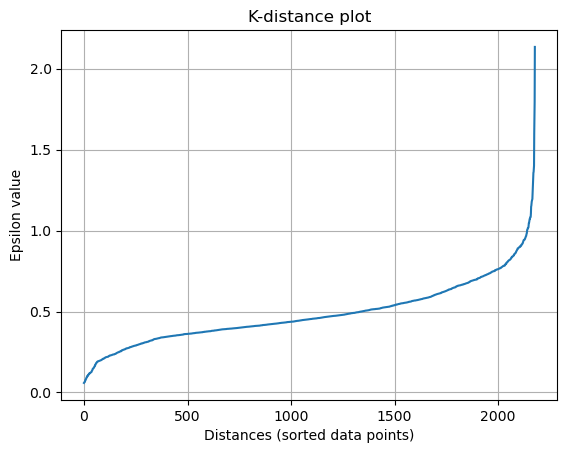

In [79]:
neighbors = NearestNeighbors(n_neighbors=8).fit(df_prep)
distances, indices = neighbors.kneighbors(df_prep)

distances = np.sort(distances, axis=0)
distances = distances[:,-1]
plt.plot(distances)
plt.xlabel("Distances (sorted data points)")
plt.ylabel("Epsilon value")
plt.title("K-distance plot")
plt.grid()
plt.show()

Assuming that the maximum curvature falls within the range of 0.7 to 1.0, we can proceed with parameter tuning.

In [80]:
epsilons = [0.7, 0.8, 0.9, 1]

## Min samples

As a rule of thumb, the min_samples value should typically be set to a number greater than the number of features + 1. Additionally, it was examined the impact of the min_samples value for a number greater than 2 times the number of features on the DBSCAN model, and the results were not satisfactory.

In [81]:
min_samples = np.arange(df_prep.shape[1]+1, df_prep.shape[1]*2 + 2, 1)
min_samples

array([ 6,  7,  8,  9, 10, 11])

## hyperparameters tuning

In [82]:
for eps in epsilons:
    for min_samp in min_samples:
        model = DBSCAN(eps=eps, min_samples=min_samp, n_jobs=-1)
        labels = model.fit_predict(df_prep)
        
        # internal metrics
        cal_har_score = calinski_harabasz_score(df_prep, labels)
        silh_score = silhouette_score(df_prep, labels)
        
        # external metrics
        ami_score = adjusted_mutual_info_score(k_means_labels, labels)
        ar_score = adjusted_rand_score(k_means_labels, labels)
        
        print(f"Epsilon {eps}, Min samples {min_samp}:")
        print(f"\t- Calinski-Harabasz score: {cal_har_score}")
        print(f"\t- Silhouette score: {silh_score}")
        print(f"\t- Adjusted mutual info score: {ami_score}")
        print(f"\t- Adjusted random index score: {ar_score}", end="\n\n")     

Epsilon 0.7, Min samples 6:
	- Calinski-Harabasz score: 252.52881859875703
	- Silhouette score: 0.3276222643927292
	- Adjusted mutual info score: 0.21850213435686186
	- Adjusted random index score: 0.05750277467271126

Epsilon 0.7, Min samples 7:
	- Calinski-Harabasz score: 251.80540071552275
	- Silhouette score: 0.3162607220450393
	- Adjusted mutual info score: 0.21936298320991315
	- Adjusted random index score: 0.05920491562860106

Epsilon 0.7, Min samples 8:
	- Calinski-Harabasz score: 244.49130179911734
	- Silhouette score: 0.30975400522818414
	- Adjusted mutual info score: 0.22617884982824432
	- Adjusted random index score: 0.06208018054654995

Epsilon 0.7, Min samples 9:
	- Calinski-Harabasz score: 180.91053565450562
	- Silhouette score: 0.2912694467408284
	- Adjusted mutual info score: 0.22690294143786127
	- Adjusted random index score: 0.06466753174020323

Epsilon 0.7, Min samples 10:
	- Calinski-Harabasz score: 229.0125122766922
	- Silhouette score: 0.2964953622065263
	- Adjus

## Best model

Among the various clustering models employed earlier, DBSCAN performed notably poorly.

The DBSCAN model was evaluated with varying parameters of epsilon (distance threshold) and min_samples on earthquake data characterized by cubic shapes in a reduced 3D space through PCA. The results, assessed using both internal and external metrics, exhibited interesting patterns. For instance, lower epsilon values and min_samples below 6 generally led to suboptimal performance, as reflected in lower scores across metrics.

The cubic shape of earthquake data in the reduced PCA space posed challenges for DBSCAN, a density-based clustering algorithm sensitive to geometric shapes and cluster density variations. Cubic clusters may not align well with the density-based criteria of DBSCAN, resulting in less effective cluster identification.

After thorough evaluation, the parameters epsilon=0.8 and min_samples=10 were chosen as the optimal configuration. Despite being the best among the tested combinations, these parameters did not yield scores as high as those observed in earlier models, indicating the complexity of the seismic data. The decision to focus on these two hyperparameters, epsilon and min_samples, was driven by their direct influence on density sensitivity and distance threshold, crucial for identifying clusters with varying shapes and densities.

In summary, the selected parameters represent a compromise between effectively capturing seismic patterns and avoiding over-segmentation in the challenging context of earthquake data with cubic shapes in reduced PCA space. The emphasis on epsilon and min_samples stems from their critical roles in addressing the specific characteristics of earthquake data, while other hyperparameters may have limited impact on the observed seismic patterns.

In [83]:
dbscan_model = DBSCAN(eps=0.8, min_samples=10, n_jobs=-1)
dbscan_labels = dbscan_model.fit_predict(df_prep)

In [84]:
pd.Series(dbscan_labels).value_counts()

 0    1994
 1     113
-1      50
 2      21
Name: count, dtype: int64

In [85]:
pca = PCA(n_components=3)
df_pca = pd.DataFrame(data=pca.fit_transform(df_prep), columns=["pca1", "pca2", "pca3"])
df_pca["cluster"] = dbscan_labels

fig = px.scatter_3d(df_pca, x="pca1", y="pca2", z="pca3", color="cluster",
                    title="3D PCA Components Scatter Plot",
                    labels={"pca1": "Principal Component 1", "pca2": "Principal Component 2", "pca3": "Principal Component 3"},
                    hover_data={"pca1": True, "pca2": True, "pca3": True, "cluster": True})

fig.show()

It is possible to identify outliers on a 3D PCA scatter plot. They are reasonably well-classified and exhibit a noticeable separation from the rest of the clusters. However, this model is significantly weaker compared to the earlier ones. On a world map, one of the cluster classes dominates prominently.

In [86]:
interactive_map(df, hue=dbscan_labels)

---

# Comparison of clustering algorithms

In [87]:
k_means = KMeans(n_clusters=5, random_state=0)
k_means_labels = k_means.fit_predict(df_prep)

## Internal metrics

In [88]:
cal_har_score_kmeans = calinski_harabasz_score(df_prep, k_means_labels)
silh_score_kmeans = silhouette_score(df_prep, k_means_labels)

cal_har_score_kmeans_minibatch = calinski_harabasz_score(df_prep, minibatch_k_means_labels)
silh_score_kmeans_minibatch = silhouette_score(df_prep, minibatch_k_means_labels)

cal_har_score_gm = calinski_harabasz_score(df_prep, gm_labels)
silh_score_gm = silhouette_score(df_prep, gm_labels)

cal_har_score_dbscan = calinski_harabasz_score(df_prep, dbscan_labels)
silh_score_dbscan = silhouette_score(df_prep, dbscan_labels)

In [89]:
print("Best K-means score:")
print(f"\t- Calinski-Harabasz score: {cal_har_score_kmeans}")
print(f"\t- Silhouette score: {silh_score_kmeans}")

Best K-means score:
	- Calinski-Harabasz score: 736.3558582025931
	- Silhouette score: 0.24517941248103087


In [90]:
print("Best Minibatch K-means score:")
print(f"\t- Calinski-Harabasz score: {cal_har_score_kmeans_minibatch}")
print(f"\t- Silhouette score: {silh_score_kmeans_minibatch}")

Best Minibatch K-means score:
	- Calinski-Harabasz score: 784.6540867683328
	- Silhouette score: 0.2440934762522105


In [91]:
print("Best Gaussian Mixture score:")
print(f"\t- Calinski-Harabasz score: {cal_har_score_gm}")
print(f"\t- Silhouette score: {silh_score_gm}")

Best Gaussian Mixture score:
	- Calinski-Harabasz score: 768.0037513777542
	- Silhouette score: 0.2438411924477276


In [92]:
print("Best DBSCAN score:")
print(f"\t- Calinski-Harabasz score: {cal_har_score_dbscan}")
print(f"\t- Silhouette score: {silh_score_dbscan}")

Best DBSCAN score:
	- Calinski-Harabasz score: 241.45987102953754
	- Silhouette score: 0.34421453675722136


In comparing the clustering performance across different models, the Calinski-Harabasz scores reveal interesting insights. The Minibatch K-means algorithm achieved the highest score, surpassing both the standard K-means and Gaussian Mixture models. This suggests that the Minibatch K-means algorithm produced clusters with more distinct boundaries, contributing to a higher inter-cluster variance relative to intra-cluster variance. In contrast, the standard K-means and Gaussian Mixture models exhibited slightly lower Calinski-Harabasz scores, implying a comparatively weaker separation between clusters.

When considering the Silhouette scores, all models displayed relatively close values, with the standard K-means, Minibatch K-means, and Gaussian Mixture models exhibiting comparable silhouette coefficients. However, the DBSCAN model notably outperformed the others in terms of silhouette score. This indicates that DBSCAN achieved better-defined clusters with more compact and well-separated data points within each cluster, as reflected in the higher silhouette coefficient.

Interestingly, while the DBSCAN model excelled in silhouette score, it lagged behind in Calinski-Harabasz score compared to the other models. This discrepancy suggests that DBSCAN may excel in capturing local structures and identifying dense regions but might struggle with emphasizing global structures, which the Calinski-Harabasz index takes into account.

## External metrics

In [93]:
ami_score_minibatch = adjusted_mutual_info_score(k_means_labels, minibatch_k_means_labels)
ar_score_minibatch = adjusted_rand_score(k_means_labels, minibatch_k_means_labels)

ami_score_gm = adjusted_mutual_info_score(k_means_labels, gm_labels)
ar_score_gm = adjusted_rand_score(k_means_labels, gm_labels)

ami_score_dbscan = adjusted_mutual_info_score(k_means_labels, dbscan_labels)
ar_score_dbscan = adjusted_rand_score(k_means_labels, dbscan_labels)

In [94]:
print(f"Best Minibatch K-means score:")
print(f"\t- Adjusted mutual info score: {ami_score_minibatch}")
print(f"\t- Adjusted random index score: {ar_score_minibatch}") 

Best Minibatch K-means score:
	- Adjusted mutual info score: 0.7662275991087973
	- Adjusted random index score: 0.7365976509874632


In [95]:
print(f"Best Gaussian Mixture score:")
print(f"\t- Adjusted mutual info score: {ami_score_gm}")
print(f"\t- Adjusted random index score: {ar_score_gm}") 

Best Gaussian Mixture score:
	- Adjusted mutual info score: 0.7161751493882349
	- Adjusted random index score: 0.7098512294430591


In [96]:
print(f"Best DBSCAN score:")
print(f"\t- Adjusted mutual info score: {ami_score_dbscan}")
print(f"\t- Adjusted random index score: {ar_score_dbscan}") 

Best DBSCAN score:
	- Adjusted mutual info score: 0.20705147136808608
	- Adjusted random index score: 0.08129846217029753


When examining the external metrics, particularly the Adjusted Mutual Information (AMI) and Adjusted Rand Index (ARI) scores, it becomes evident that the Minibatch K-means model outperforms both the Gaussian Mixture and DBSCAN models. The AMI and ARI scores for Minibatch K-means are consistently higher, indicating a better agreement between the clustering results and the ground truth labels derived from K-Means.

Comparatively, the Gaussian Mixture model follows with slightly lower AMI and ARI scores than Minibatch K-means, implying a somewhat weaker alignment with the ground truth labels. This suggests that while Gaussian Mixture captures certain patterns, it may not be as effective as Minibatch K-means in reproducing the clustering structure imposed by K-Means.

On the other hand, the DBSCAN model lags significantly behind in both AMI and ARI scores. This indicates a lower degree of similarity between the DBSCAN-generated clusters and the ground truth labels obtained from K-Means. The inherent nature of DBSCAN, which identifies dense regions as clusters, might lead to divergent cluster assignments compared to the more conventional K-Means.

In summary, when using external metrics based on ground truth labels from K-Means, the Minibatch K-means model exhibits superior performance, showcasing a higher level of agreement with the predefined clustering structure. Gaussian Mixture follows closely, while DBSCAN demonstrates comparatively weaker alignment, possibly due to its sensitivity to local density variations that may not align with the global structure imposed by K-Means.

## Visualizations of the best clustering algorithms

In [97]:
interactive_map(df, hue=k_means_labels)

In [98]:
interactive_map(df, hue=minibatch_k_means_labels)

In [99]:
interactive_map(df, hue=gm_labels)

While MiniBatch K-means demonstrated superior performance according to these metrics, it's important to note that for the specific analysis on a world map, the **standard K-means algorithm was chosen as the overall best performer**. This decision was based on a comprehensive consideration of various factors, including interpretability, cluster shapes, and the ability to capture meaningful patterns in the data.